# **🍎 Where's the Fruit? Me-No-Know 🍊**

## **Fruit Object Detection using YOLOv8**

**by Ruvarashe Sadya**

<p align="left"> <img src="https://media1.giphy.com/media/v1.Y2lkPTc5MGI3NjExd2xpaXI5dnZpcm5vbnFlc2pqeGswaXo5Nm1ycDhiYTlqbnMxYnJnYiZlcD12MV9pbnRlcm5hbF9naWZfYnlfaWQmY3Q9Zw/TlK63EwPt59cg4UrUsM/giphy.gif" width="890"> </p>

---

> ## **Introduction**
>
> This project looks at automated fruit detection with YOLOv8. Food waste is a huge problem globally, and part of that comes from inefficient sorting and handling of fresh produce. I built an object detector to find and classify six types of fruit (apple, banana, grape, orange, pineapple, watermelon) using a dataset of about 8,479 images. The project could be used to build knowledge to  speed up quality control and inventory tasks in supply chains.
> This notebook covers the whole pipeline: dataset analysis, transfer learning, training, evaluation, and a brief ethics discussion.

---

> ## **Project Objectives**
>
> * Build a YOLOv8 detector fine-tuned on fruit images
> * Aim for >50% mAP@0.5 on the test set (transfer learning)
> * Check how class imbalance affects results
> * Discuss ethical aspects of automating sorting systems

> **Technical specs**
>
> * Architecture: YOLOv8
> * Dataset: 8,479 images (train: 7,108; val: 914; test: 457)
> * Classes: 6 fruit types
> * Metric: mAP@0.5
> * Hardware: Tesla T4 (Google Colab)


# Imports AND Constants


In [ ]:
# Libraries

# Python built-ins
import glob
import random
from pathlib import Path
import shutil

# For handling data, config files, and simple plots
import numpy as np
import yaml
import matplotlib.pyplot as plt

# Pillow for image loading and quick drawing
from PIL import Image as PILImage, ImageDraw

# for data curation, downloading coco images
import subprocess
import requests
from pycocotools.coco import COCO

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Constants

FRUIT_CLASSES = ['apple', 'banana', 'grape', 'orange', 'pineapple', 'watermelon'] # fruit classes
BOX_COLORS = ['green', 'yellow', 'pink', 'orange', 'blue', 'red'] # bbox colors for the fruits

dataset_root = '/content/fruit-detection' # directories for the images

NUM_COCO_BACKGROUNDS = 800
COCO_EXCLUDE_CLASSES = ['apple', 'banana', 'orange', 'broccoli', 'carrot']

# Setup & Data Download

In [19]:
# don't really need this because i'm running on colab t4s but was for local
def check_gpu():
    """Check if GPU is available"""
    import torch
    if torch.cuda.is_available():
        print(f"GPU: {torch.cuda.get_device_name(0)}")
    else:
        print("No GPU, will use CPU")

In [ ]:
def setup():
    """
    Set up everything needed to run the fruit detection project.
    Installs packages, downloads the dataset
    """
    # kaggle: to download datasets from Kaggle
    # ultralytics: for YOLO (the object detection model we'll use)
    !pip install -q kaggle ultralytics

    print("Upload the kaggle.json file when prompted below.")
    # Upload the kaggle.json file
    from google.colab import files
    uploaded = files.upload()

    # Set up Kaggle on this system
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/  # Move the uploaded file to the right place
    !chmod 600 ~/.kaggle/kaggle.json

    # Now download the fruit detection dataset from Kaggle
    print("\nDownloading the fruit detection dataset")
    !kaggle datasets download -d lakshaytyagi01/fruit-detection
    # Unzip the dataset to the root content folder
    !unzip -q fruit-detection.zip -d /content/fruit-detection

    # Quick check to see what we got
    print("\nVerifying the downloaded files (showing first 20 lines):")
    !ls -R /content/fruit-detection | head -20

# Data Exploration

**Bounding Box Format: YOLO (CXCYWH)**

The **YOLO (You Only Look Once)** format, specifically the **CXCYWH** representation, is a widely adopted standard in object detection for describing the location and size of a bounding box. This format was prominently introduced in the [YOLOv3 paper](https://arxiv.org/abs/1804.02767) and is used in many subsequent versions like v8.

The CXCYWH format describes the bounding box using **four normalized floating-point values**:

* $center\_x$: The normalized **x-coordinate of the center** of the bounding box.
* $center\_y$: The normalized **y-coordinate of the center** of the bounding box.
* $width$: The normalized **width** of the bounding box.
* $height$: The normalized **height** of the bounding box.

> Format structure: $[center\_x, center\_y, box\_width, box\_height]$

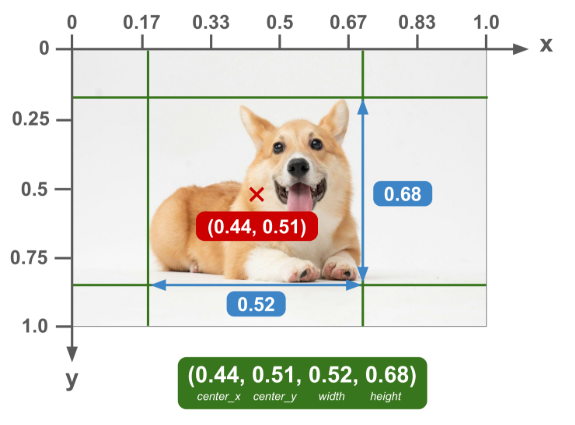


In the YOLO format, all coordinates and dimensions are **normalized** to a value between **0.0 and 1.0** relative to the image size.

This normalization is calculated using the following formulas:

$$x_{normalized} = \frac{x_{absolute}}{image\_width}$$

$$y_{normalized} = \frac{y_{absolute}}{image\_height}$$

* **$x_{absolute}$** and **$y_{absolute}$** represent the coordinates or dimensions in **pixels**.
* **$image\_width$** and **$image\_height$** are the total pixel dimensions of the image.

This normalized format is beneficial because it makes the bounding box coordinates **independent of the image resolution**, which is ideal for training deep learning models.

Learned from:
* [Guide to Bounding Box Formats](https://www.learnml.io/posts/a-guide-to-bounding-box-formats/)
* [A Guide to Bounding Boxes](https://dragoneye.ai/blog/a-guide-to-bounding-box-formats/#yolo)

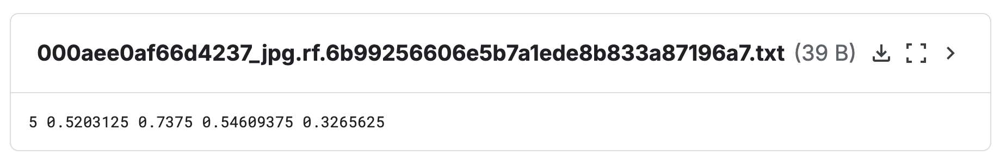

In [ ]:
def parse_label(label_path):
    """
    Read a YOLO label text file. Each line should have: class_id x_center y_center width height.
    Returns a list of dictionaries with the parsed values.
    """
    labels = []
    with open(label_path, 'r') as file:
        for line in file:
            # Split the line into parts and strip any extra whitespace
            parts = line.strip().split()
            # There are exactly 5 numbers per line (class + 4 normalised coordinates)
            if len(parts) == 5:
                labels.append({
                    'class_id': int(parts[0]),
                    'x': float(parts[1]),  # center x
                    'y': float(parts[2]), # center y
                    'w': float(parts[3]), # width
                    'h': float(parts[4])  # height
                })
    return labels

In [ ]:
def label_to_xyxy(label, img_width, img_height):
    """
    Converts YOLO CXCYWH format to corner coordinates (pixels values)
    Useful as a helper function to draws the labels onto images

    Returns:
        Tuple of (x_min, y_min, x_max, y_max) in pixels
    """
    # Convert normalized center coordinates to pixel values
    x_center = label['x'] * img_width
    y_center = label['y'] * img_height
    width = label['w'] * img_width
    height = label['h'] * img_height

    # basically to get the corners from center you subtract/add half the width/height
    x_min = int(x_center - width / 2) 
    y_min = int(y_center - height / 2)
    x_max = int(x_center + width / 2)
    y_max = int(y_center + height / 2)

    return x_min, y_min, x_max, y_max

In [ ]:
def visualize_labels(image_path, label_path):
    """
    Draw bounding boxes on an image to see what the labels look like.
    """
    # Load the image
    image = PILImage.open(image_path)
    img_width, img_height = image.size
    draw = ImageDraw.Draw(image)

    # Read the label file
    labels = parse_label(label_path)

    # for each object in the image
    for label in labels:
        # Convert from YOLO format (center x, center y, width, height) to corner coordinates
        x_min, y_min, x_max, y_max = label_to_xyxy(label, img_width, img_height)

        # Get which fruit this is and pick a color for it
        class_id = label['class_id']
        fruit_name = FRUIT_CLASSES[class_id]
        box_color = BOX_COLORS[class_id]

        # Draw the box around the fruit
        draw.rectangle([x_min, y_min, x_max, y_max], outline=box_color, width=3)
        draw.text((x_min, y_min - 15), fruit_name, fill=box_color) # Put the fruit name above the box

    # Show the image with all the boxes drawn
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(f"Objects: {len(labels)}")
    plt.axis('off')
    plt.show()

    print(f"\nImage: {image_path.split('/')[-1]}")

In [ ]:
def show_sample_images(split='train'):
    """
    For each fruit class, pick a random image that contains that fruit.
    Then show all the bounding boxes on that image.
    Shows 6 separate images, one for each fruit.
    """

    # Figure out where the images and labels are stored
    images_dir = f'{dataset_root}/Fruits-detection/{split}/images'
    labels_dir = f'{dataset_root}/Fruits-detection/{split}/labels'

    for class_id, fruit_name in enumerate(FRUIT_CLASSES):
        # Find all images that contain this specific fruit
        images_with_this_fruit = []

        # Check every label file in the dataset
        for label_file in glob.glob(f'{labels_dir}/*.txt'):
            with open(label_file, 'r') as f:
                # Look through each line in the label file
                for line in f:
                    # The first number in each line is the class ID
                    if line.startswith(str(class_id)):
                        # Convert label file path to image file path
                        img_file = label_file.replace('labels', 'images').replace('.txt', '.jpg')
                        images_with_this_fruit.append(img_file)
                        break  # Found it, no need to check other lines

        # If we found images with this fruit, pick one at random
        if images_with_this_fruit:
            chosen_image_path = random.choice(images_with_this_fruit)
            chosen_label_path = chosen_image_path.replace('images', 'labels').replace('.jpg', '.txt')

            # Print which fruit and bboxes for all objects
            print(f"\nShowing example with {fruit_name}:")
            print(f"  Image: {chosen_image_path.split('/')[-1]}")
            visualize_labels(chosen_image_path, chosen_label_path)

In [ ]:
def object_class_distribution(split='train'):
    """
    Count how many bounding boxes we have for each fruit class.
    Also shows how many objects are in each image on average.
    Helps spot class imbalances and understand the dataset.
    """
    # Figure out where the labels are stored for this split
    labels_dir = f'{dataset_root}/Fruits-detection/{split}/labels'
    label_files = glob.glob(f'{labels_dir}/*.txt')

    # Count objects per class (start with zeros for all 6 fruits)
    class_counts = [0] * len(FRUIT_CLASSES)
    total_objects = sum(class_counts)
    objects_per_image_list = [] # hold how many objects are in each image

    # Go through every label file and count the objects
    for label_path in label_files:
        labels = parse_label(label_path)
        objects_in_this_image = len(labels)
        objects_per_image_list.append(objects_in_this_image)

        for label in labels:
            fruit_class = label['class_id']
            class_counts[fruit_class] += 1

    # DISTRIBUTION TABLE
    print(f"OBJECT DISTRIBUTION ({split.upper()} SET)")
    print(f"{'Class':<15} {'Objects':<10} {'Percentage':<10}")
    for fruit_name, count in zip(FRUIT_CLASSES, class_counts):
        percentage = (count / total_objects) * 100 if total_objects > 0 else 0
        print(f"{fruit_name:<15} {count:<10} {percentage:>8.1f}%")

    if objects_per_image_list:
        mean_objects = np.mean(objects_per_image_list)
        median_objects = np.median(objects_per_image_list)
        max_objects = max(objects_per_image_list)

    # BAR CHART OF CLASS DISTRIBUTION
    fig, ax = plt.subplots(figsize=(10, 6))
    bars = ax.bar(FRUIT_CLASSES, class_counts, color='steelblue', alpha=0.8, edgecolor='black')

    # Add the count numbers on top of each bar
    total_objects = sum(class_counts)
    for bar, count in zip(bars, class_counts):
        bar_height = bar.get_height()
        percentage = (count / total_objects) * 100 if total_objects > 0 else 0

        # Put the count and percentage on the bar
        ax.text(bar.get_x() + bar.get_width()/2., bar_height,
                f'{count}\n({percentage:.1f}%)',
                ha='center', va='bottom', fontsize=10, fontweight='bold')

    ax.set_ylabel('Number of Objects', fontsize=12, fontweight='bold')
    ax.set_xlabel('Fruit Class', fontsize=12, fontweight='bold')
    ax.set_title(f'Object Distribution ({split.capitalize()} Set)', fontsize=14, fontweight='bold')
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print()
    print()

    # HISTOGRAM OF OBJECTS PER IMAGE
    if objects_per_image_list:
        plt.figure(figsize=(10, 6))

        # Create histogram showing how many objects are in each image
        plt.hist(objects_per_image_list,
                bins=range(0, max_objects + 2),  
                edgecolor='black', color='skyblue', alpha=0.7)

        plt.xlabel('Number of Objects per Image', fontsize=12)
        plt.ylabel('Number of Images', fontsize=12)
        plt.title('How Many Fruits Are in Each Image?', fontsize=14, fontweight='bold')
        plt.axvline(mean_objects, color='red', linestyle='--', linewidth=2,
                   label=f'Average: {mean_objects:.1f}')
        plt.axvline(median_objects, color='green', linestyle='--', linewidth=2,
                   label=f'Median: {median_objects:.0f}')

        plt.legend()
        plt.grid(True, alpha=0.3, axis='y')
        plt.tight_layout()
        plt.show()

In [ ]:
def object_size_distribution(split='train'):
    """
    Look at how big the fruits are in the images (as percentage of the image).
    Shows which fruits tend to be small vs large, and finds tiny objects (<1% of image).
    """
    # Figure out where the labels are stored for this split
    labels_dir = f'{dataset_root}/Fruits-detection/{split}/labels'
    label_files = glob.glob(f'{labels_dir}/*.txt')

    # Store areas for each fruit class (area as percentage of the whole image)
    bbox_areas = [[] for _ in range(len(FRUIT_CLASSES))]  # One list per fruit class

    # Store all widths and heights (just for the final summary)
    all_widths = []
    all_heights = []

    # Go through every label file
    for label_path in label_files:
        labels = parse_label(label_path)  # Use our existing parse_label function

        for label in labels:
            fruit_class = label['class_id']
            width_normalized = label['w']   # Value between 0-1
            height_normalized = label['h']  # Value between 0-1

            # Calculate area as percentage of the whole image
            # If w=0.5 and h=0.5, area = 0.25 * 100 = 25% of the image
            area_percent = (width_normalized * height_normalized) * 100

            # Save this info
            bbox_areas[fruit_class].append(area_percent)
            all_widths.append(width_normalized * 100)    # Convert to percentage
            all_heights.append(height_normalized * 100)  # Convert to percentage

    # TABLE OF SIZE DISTRIBUTION
    print(f"OBJECT SIZE DISTRIBUTION ({split.upper()} SET)")
    print("Average bounding box size (% of image) per class:")

    for i, fruit_name in enumerate(FRUIT_CLASSES):
        if bbox_areas[i]:  # Only if we found some objects of this class
            areas_for_this_fruit = bbox_areas[i]
            avg_size = np.mean(areas_for_this_fruit)
            min_size = np.min(areas_for_this_fruit)
            max_size = np.max(areas_for_this_fruit)

            print(f"{fruit_name:12} | Avg: {avg_size:5.2f}% | "
                  f"Min: {min_size:5.2f}% | Max: {max_size:5.2f}%")

    # Check for tiny objects)
    all_areas = []
    for class_areas in bbox_areas:
        all_areas.extend(class_areas)

    if all_areas:  # Only calculate if we found any objects at all
        tiny_objects = sum(1 for area in all_areas if area < 1.0)
        tiny_percentage = (tiny_objects / len(all_areas)) * 100

        print(f"\nTiny objects (<1% of image area):")
        print(f"  {tiny_objects} out of {len(all_areas)} objects ({tiny_percentage:.1f}%)")
        print(f"Overall average bbox size: {np.mean(all_areas):.2f}% of image")

    # BOX PLOT OF SIZE DISTRIBUTION
    plt.figure(figsize=(12, 6))
    plt.boxplot(bbox_areas, labels=FRUIT_CLASSES, patch_artist=True)
    plt.ylabel('Bounding Box Area (% of image)', fontsize=12)
    plt.xlabel('Fruit Class', fontsize=12)
    plt.title(f'How Big Are the Fruits? ({split.capitalize()} Set)', fontsize=14, fontweight='bold')
    plt.xticks(rotation=45)  # Tilt the fruit names
    plt.grid(True, alpha=0.3, axis='y')
    plt.tight_layout()
    plt.show()

In [18]:
def plot_multi_fruit_stats(dataset_root):
    """
    Check how often fruits appear alone vs together with other fruits.
    """
    splits = ['train', 'valid', 'test']
    results = []  # Store counts for each split

    # Count single vs multiple fruit images for each split
    for split in splits:
        labels_dir = f'{dataset_root}/Fruits-detection/{split}/labels'
        single_fruit_count = 0
        multiple_fruit_count = 0

        # Check every label file in this split
        label_files = glob.glob(f'{labels_dir}/*.txt')
        for label_file in label_files:
            with open(label_file, 'r') as f:
                # Count how many non-empty lines (each line = one fruit)
                fruit_count = 0
                for line in f:
                    if line.strip():  # Skip empty lines
                        fruit_count += 1

                # Categorize the image
                if fruit_count > 1:
                    multiple_fruit_count += 1
                else:
                    single_fruit_count += 1

        # Save results for this split
        results.append({
            'split': split,
            'single': single_fruit_count,
            'multiple': multiple_fruit_count
        })

    # Create stacked bar chart
    fig, ax = plt.subplots(figsize=(10, 6))

    # Prepare data for the chart
    x_positions = range(len(splits))
    single_counts = [result['single'] for result in results]
    multiple_counts = [result['multiple'] for result in results]

    # Draw the bars (stacked)
    ax.bar(x_positions, single_counts, label='Single Fruit',
           color='lightgreen', edgecolor='black')
    ax.bar(x_positions, multiple_counts, bottom=single_counts,
           label='Multiple Fruits', color='coral', edgecolor='black')

    # Make the chart look nice
    ax.set_xlabel('Dataset Split')
    ax.set_ylabel('Number of Images')
    ax.set_title('Do Fruits Appear Alone or Together?')
    ax.set_xticks(x_positions)
    ax.set_xticklabels(splits)
    ax.legend()

    # Add percentage labels on top of each bar
    for i, result in enumerate(results):
        total_images = result['single'] + result['multiple']
        multiple_percentage = (result['multiple'] / total_images) * 100
        ax.text(i, total_images, f"{multiple_percentage:.1f}%",
               ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

# Data Curation

Method adopted from: [https://y-t-g.github.io/tutorials/bg-images-for-yolo/]

In [ ]:
def add_coco_backgrounds(num_images=NUM_COCO_BACKGROUNDS,
                        exclude_classes=COCO_EXCLUDE_CLASSES,
                        train_dir=f'{dataset_root}/Fruits-detection/train'):
    """
    Download background images from COCO dataset to add to training.
    Helps the model learn what 'nothing' looks like (images with no fruits).
    """

    # Getting the COCO annotations which tell what's in each image
    print("Downloading COCO annotations")
    subprocess.run(['wget', '-q', 'http://images.cocodataset.org/annotations/annotations_trainval2017.zip'], check=True)
    subprocess.run(['unzip', '-q', 'annotations_trainval2017.zip'], check=True)
    print("Downloaded COCO annotations")

    # Figure out which COCO images don't have our fruits/veggies
    coco = COCO('annotations/instances_train2017.json')

    # Get IDs of images that do contain the classes to be excluded
    exclude_category_ids = coco.getCatIds(catNms=exclude_classes)
    exclude_image_ids = set()
    for cat_id in exclude_category_ids:
        # Get all images that contain this category
        img_ids_with_this_category = coco.getImgIds(catIds=cat_id)
        exclude_image_ids.update(img_ids_with_this_category)

    # Background images = all COCO images minus the ones with fruits/veggies
    all_image_ids = set(coco.getImgIds())
    background_image_ids = list(all_image_ids - exclude_image_ids)
    random.seed(42)  # seed for reproducibility
    random.shuffle(background_image_ids)  # shuffle em for randomness

    # Take only the number we asked for
    background_images = coco.loadImgs(background_image_ids[:num_images])

    print(f'Downloading {len(background_images)} images')

    # Downloading each image and saving it to our training folder
    for idx, image_info in enumerate(background_images):
        image_data = requests.get(image_info["coco_url"], timeout=10).content # Download the actual image
        image_path = f"{train_dir}/images/coco_bg_{image_info['file_name']}" # Save image with 'coco_bg_' prefix 
        with open(image_path, "wb") as f:
            f.write(image_data)

        # Create an empty label file (no objects = background)
        label_path = f"{train_dir}/labels/coco_bg_{image_info['file_name'].replace('.jpg', '.txt')}"
        open(label_path, 'w').close()

        # Show progress every 100 images
        if (idx + 1) % 100 == 0:
            print(f"  Downloaded {idx + 1}/{len(background_images)} images...")

    total_train_images = len(glob.glob(f"{train_dir}/images/*.jpg"))

    print(f"\nAdded {len(background_images)} background images")
    print(f"Total training images now: {total_train_images}")

    return len(background_images)

# Create YAML Config for YOLO

In [ ]:
def create_yaml(dataset_root, yaml_name='fruit_data.yaml'):
    """
    Create the YAML config file that YOLO needs to know where your data is.
    This file tells YOLO about your dataset structure and class names.
    """
    config = {
        'path': f'{dataset_root}/Fruits-detection',  # Root folder
        'train': 'train/images',   
        'val': 'valid/images',      
        'test': 'test/images',      
        'nc': 6,                    # Number of classes
        'names': FRUIT_CLASSES      # List of class names
    }

    # Save to a YAML file
    yaml_path = f'/content/{yaml_name}'
    with open(yaml_path, 'w') as f:
        yaml.dump(config, f)

    print(f"Config saved: {yaml_path}")
    return yaml_path

# Training

In [ ]:
def train_model(
    data_yaml,
    model_name,
    epochs=30,
    batch_size=16
):
    """
    Train a YOLOv8n model on the fruit dataset and save results to Google Drive.
    """

    from ultralytics import YOLO
    print(f"Starting training run: {model_name}")

    # Load pretrained YOLOv8n
    model = YOLO("yolov8n.pt")

    # Train
    results = model.train(
        data=data_yaml,
        imgsz=640,
        epochs=epochs,
        batch=batch_size,

        # Optimizer & LR schedule
        optimizer="auto",
        lr0=0.01,

        # Light (others resolve to yolo defaults)
        mixup=0.1,

        # Training control
        patience=5,
        workers=2,

        # Runtime
        device=0,             # GPU if available
        project="fruit_detection",
        name=model_name,
        exist_ok=True,
        plots=True,
        save=True,
        save_period=5,       # Save a checkpoint every 5 epochs
        verbose=True
    )

    # Local results
    results_path = Path(results.save_dir)
    best_model_path = results_path / "weights" / "best.pt"

    # Google Drive backup
    drive_root = Path("/content/drive/MyDrive/fruit_detection_models")
    drive_root.mkdir(parents=True, exist_ok=True)
    drive_save_path = drive_root / model_name

    print("Backing up results to Google Drive")
    shutil.copytree(results_path, drive_save_path, dirs_exist_ok=True)

    print("Training complete")
    print(f"Local results: {results_path}")
    print(f"Drive backup: {drive_save_path}")
    print(f"Best model: {best_model_path}")

    return str(results_path), str(best_model_path)


# Eval + Visualisation

In [6]:
def show_training_results(results_path):
    """Display training plots from local or Google Drive path"""
    results_img = Path(results_path) / "results.png"

    if results_img.exists():
        img = PILImage.open(results_img)
        plt.figure(figsize=(15, 10))
        plt.imshow(img)
        plt.axis('off')
        plt.title('Training Results')
        plt.show()
    else:
        print(f"Results not found at: {results_img}")

In [ ]:
def plot_all_metrics(model_path, results_path):
    """
    Plot per-class metrics, confusion matrix, AND all performance curves.

    Args:
        model_path: Path to best.pt model weights
        results_path: Path to training results folder (where plots are saved)
    """
    from ultralytics import YOLO

    # Per-class metrics bar chart
    print("Running validation on test set.")
    model = YOLO(model_path)
    results = model.val(
      data='./fruit_data.yaml',
      split='test',
      conf=0.1,
      iou=0.5,
      max_det=300
    )

    # Get the accuracy for each individual class
    # This is an array where index 0 = accuracy for class 0 (apple), etc.
    class_accuracies = results.box.maps

    # Make a bar chart
    fig, ax = plt.subplots(figsize=(10, 6))
    bars = ax.bar(FRUIT_CLASSES, class_accuracies, color='coral')

    # Put the exact accuracy number on top of each bar
    for bar in bars:
        bar_height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2,
                bar_height,
                f'{bar_height:.3f}',  # Show 3 decimal places
                ha='center', va='bottom')

    ax.set_ylabel('mAP@0.5')
    ax.set_title('How Accurate is the Model for Each Fruit?')

    # Draw a line showing the overall average accuracy
    avg_map = results.box.map50
    ax.axhline(avg_map, color='red', linestyle='--',
               label=f'Overall: {avg_map:.3f}')

    ax.legend()
    plt.tight_layout()
    plt.show()


    # Display all performance curves
    plots_to_show = [
        ('confusion_matrix_normalized.png', 'Confusion Matrix (Normalized)'),
        ('BoxPR_curve.png', 'Precision-Recall Curve'),
        ('BoxF1_curve.png', 'F1-Confidence Curve'),
        ('BoxP_curve.png', 'Precision-Confidence Curve'),
        ('BoxR_curve.png', 'Recall-Confidence Curve')
    ]

    results_dir = Path(results_path)

    for plot_file, title in plots_to_show:
        plot_path = results_dir / plot_file

        if plot_path.exists():
            print(f"\n✓ Displaying: {plot_file}")
            img = PILImage.open(plot_path)
            plt.figure(figsize=(12, 8))
            plt.imshow(img)
            plt.axis('off')
            plt.title(title, fontsize=14, pad=10)
            plt.tight_layout()
            plt.show()
        else:
            print(f"Not found: {plot_file}")

In [8]:
def show_predictions(model_path, dataset_root):
    """Show correct predictions (top 2 rows) and failures (bottom 2 rows), 1 per class"""
    from ultralytics import YOLO

    model = YOLO(model_path)
    images_dir = f"{dataset_root}/Fruits-detection/test/images"
    image_files = glob.glob(f"{images_dir}/*.jpg")

    # Find 1 correct and 1 failure per class
    correct = {i: None for i in range(6)}
    failures = {i: None for i in range(6)}

    # looping through the test
    for img_path in image_files:
        label_path = img_path.replace('images', 'labels').replace('.jpg', '.txt')
        gt_labels = parse_label(label_path)

        if not gt_labels:
            continue

        results = model.predict(img_path, conf=0.25, verbose=False)

        # Check for failures (missed detections)
        if len(results[0].boxes) == 0:
            for gt in gt_labels:
                class_id = gt['class_id']
                if failures[class_id] is None:
                    failures[class_id] = img_path
        else:
            # Check for correct detections
            for gt in gt_labels:
                class_id = gt['class_id']
                if correct[class_id] is None:
                    correct[class_id] = img_path

        # Stop if we found all
        if all(correct.values()) and all(failures.values()):
            break

    # Plot 4 rows x 6 cols (top 2 = correct, bottom 2 = failures)
    fig, axes = plt.subplots(4, 6, figsize=(18, 12))

    # Top 2 rows Correct predictions
    for class_id in range(6):
        if correct[class_id]:
            results = model.predict(correct[class_id], conf=0.25, verbose=False)
            img_with_boxes = results[0].plot()
            img_rgb = img_with_boxes[:, :, ::-1]

            # Row 0 and 1
            axes[0, class_id].imshow(img_rgb)
            axes[0, class_id].axis('off')
            axes[0, class_id].set_title(f'{FRUIT_CLASSES[class_id]}\n✓ Correct')

            axes[1, class_id].axis('off')  # Empty row 1

    # Bottom 2 rows Failures
    for class_id in range(6):
        if failures[class_id]:
            img = PILImage.open(failures[class_id])

            # Row 2 and 3
            axes[2, class_id].imshow(img)
            axes[2, class_id].axis('off')
            axes[2, class_id].set_title(f'{FRUIT_CLASSES[class_id]}\n✗ Missed')

            axes[3, class_id].axis('off')  # Empty row 3

    plt.tight_layout()
    plt.show()

In [ ]:
def analyze_missed_detection_sizes(model_path, split='test'):
    """
    Look at what sizes of objects we're missing for each class.
    Basically, are we failing to detect small fruits more than large ones?
    """
    from ultralytics import YOLO
    import numpy as np
    import matplotlib.pyplot as plt
    import glob

    # Load up our trained model
    model = YOLO(model_path)

    # Figure out where our test images and labels are
    images_dir = f'{dataset_root}/Fruits-detection/{split}/images'
    labels_dir = f'{dataset_root}/Fruits-detection/{split}/labels'

    # We'll store missed object sizes here, one list per fruit class
    missed_sizes_by_class = [[] for _ in FRUIT_CLASSES]

    # Grab all the test images
    image_files = glob.glob(f'{images_dir}/*.jpg')
    print(f"Looking through {len(image_files)} images...")

    # Check each image one by one
    for img_path in image_files:
        # Get the corresponding label file path
        label_path = img_path.replace('images', 'labels').replace('.jpg', '.txt')

        # Read what fruits are actually in this image
        ground_truth_labels = parse_label(label_path)
        if not ground_truth_labels:
            continue  # Skip if there's no labels for this one

        # Run our model on this image to see what it detects
        predictions = model.predict(img_path, conf=0.25, verbose=False)[0].boxes

        # Get the center points of all detected objects
        prediction_centers = []
        for box in predictions:
            center_point = box.xywhn[0].cpu().numpy()[:2]
            prediction_centers.append(center_point)

        # Now check each actual fruit in the image
        for truth_label in ground_truth_labels:
            # Where this fruit actually is in the image
            truth_center = np.array([truth_label['x'], truth_label['y']])

            # How big it is (as percentage of total image)
            size_percentage = truth_label['w'] * truth_label['h'] * 100

            # See if any prediction is close enough to count as detecting this fruit
            # Using a simple distance check - if centers are within 10% of image size
            detected = False
            for pred_center in prediction_centers:
                distance = np.linalg.norm(truth_center - np.array(pred_center))
                if distance < 0.1:  # Our detection threshold
                    detected = True
                    break

            # If we didn't detect it, record its size for later analysis
            if not detected:
                class_id = truth_label['class_id']
                missed_sizes_by_class[class_id].append(size_percentage)

    # Collect these for making the chart
    average_sizes = []
    missed_counts = []
    fruit_names = []

    # Go through each fruit type
    for class_idx, size_list in enumerate(missed_sizes_by_class):
        if size_list:  # Only include fruits we actually missed some of
            average_sizes.append(np.mean(size_list))
            missed_counts.append(len(size_list))
            fruit_names.append(FRUIT_CLASSES[class_idx])

    # Make a bar chart to visualize the results
    plt.figure(figsize=(10, 6))
    bars = plt.bar(fruit_names, average_sizes, alpha=0.75, color='skyblue')

    # Add the number of missed objects on top of each bar
    for bar, count in zip(bars, missed_counts):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f'count={count}',
            ha='center',
            va='bottom',
            fontsize=10
        )

    plt.ylabel('Average Size of Missed Objects (% of image)')
    plt.xlabel('Fruit Type')
    plt.title('What sizes of fruits are we missing?')
    plt.xticks(rotation=45, ha='right')  # Tilt the fruit names so they fit
    plt.grid(axis='y', alpha=0.3)  

    plt.tight_layout()  
    plt.show()

# Main

In [21]:
check_gpu()

GPU: Tesla T4


In [22]:
setup()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 54.0 MB/s eta 0:00:00
Upload the kaggle.json file when prompted below.


Saving kaggle.json to kaggle.json

Dataset URL: https://www.kaggle.com/datasets/lakshaytyagi01/fruit-detection
License(s): CC0-1.0
 92% 461M/501M [00:02<00:00, 101MB/s]
100% 501M/501M [00:03<00:00, 175MB/s]

Verifying the downloaded files (showing first 20 lines):
/content/fruit-detection:
Fruits-detection

/content/fruit-detection/Fruits-detection:
cli.log
data.yaml
README.txt
test
train
valid
yolov8s.pt

/content/fruit-detection/Fruits-detection/test:
images
labels

/content/fruit-detection/Fruits-detection/test/images:
000aee0af66d4237_jpg.rf.6b99256606e5b7a1ede8b833a87196a7.jpg
000d9c59687b509b_jpg.rf.c338360b3dfe1953a5d266ee861d7e79.jpg
000e4e7ed48c932d_jpg.rf.8233751e16b32b9470e45c6135c8f8c7.jpg


In [27]:
data_yaml = create_yaml(dataset_root)

Config saved: /content/fruit_data.yaml


## Data Exploration


Showing example with apple:
  Image: 7b48a9a35bd6d138_jpg.rf.c77cfb373f0f118fd2d72af7e9febfaf.jpg


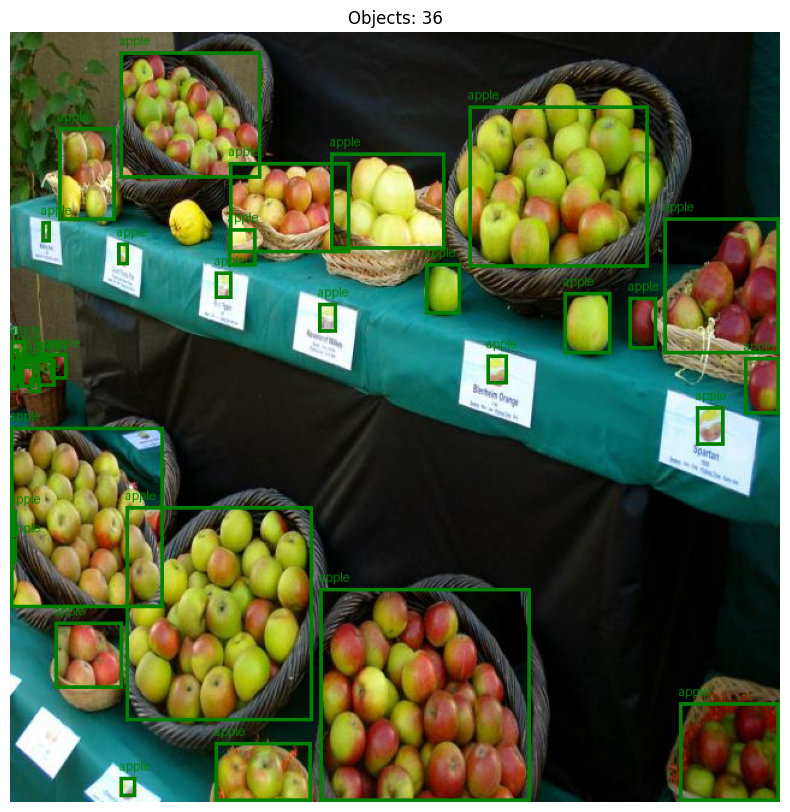


Image: 7b48a9a35bd6d138_jpg.rf.c77cfb373f0f118fd2d72af7e9febfaf.jpg

Showing example with banana:
  Image: a1a21212960595ca_jpg.rf.e036f05f1f29d99f53fea696767ce736.jpg


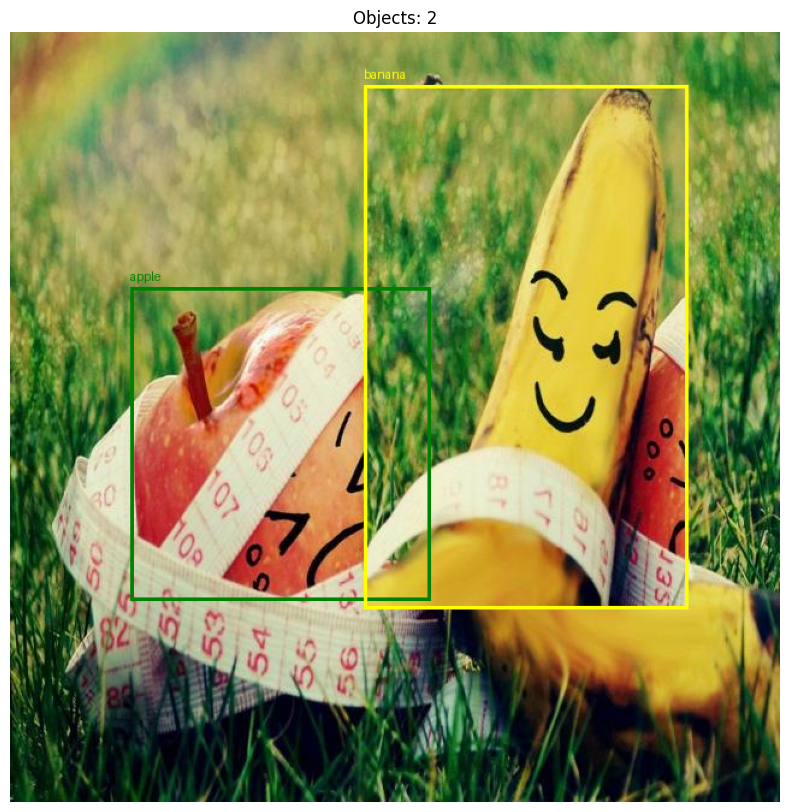


Image: a1a21212960595ca_jpg.rf.e036f05f1f29d99f53fea696767ce736.jpg

Showing example with grape:
  Image: 1d461fed9a1ecf26_jpg.rf.24a3a4d1778914140e0b8e68d5fefa8f.jpg


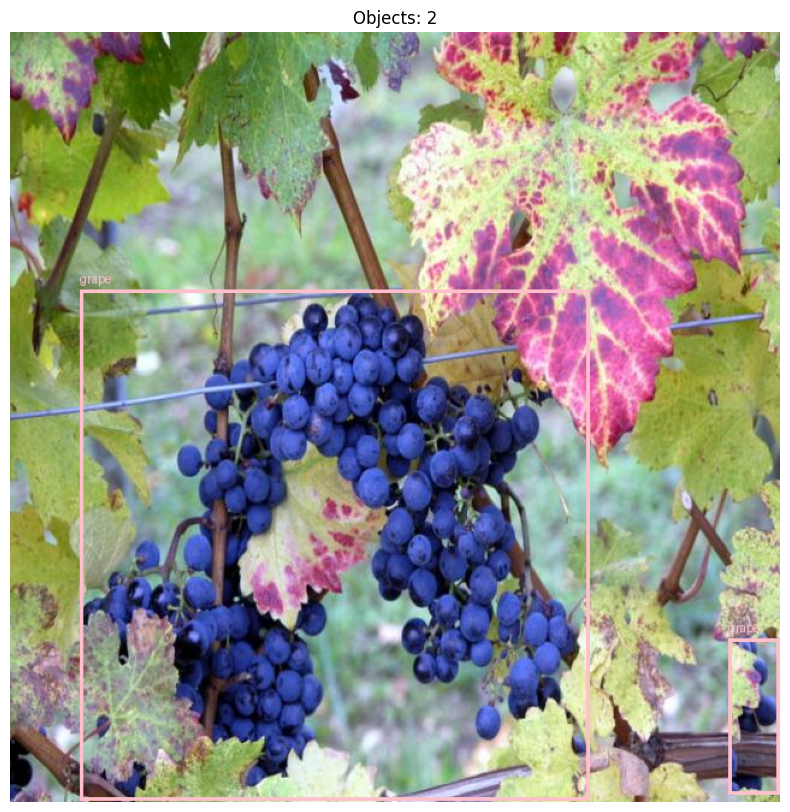


Image: 1d461fed9a1ecf26_jpg.rf.24a3a4d1778914140e0b8e68d5fefa8f.jpg

Showing example with orange:
  Image: 195df8d078de6dad_jpg.rf.83cd712b7185a2256de0d213780e4b99.jpg


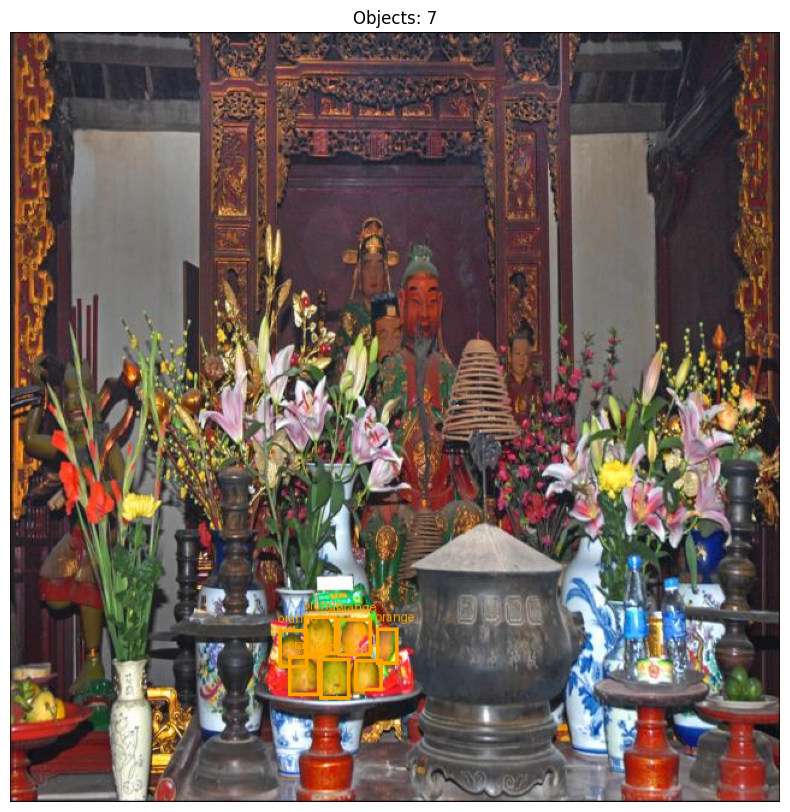


Image: 195df8d078de6dad_jpg.rf.83cd712b7185a2256de0d213780e4b99.jpg

Showing example with pineapple:
  Image: 9d7e7a3f3af62836_jpg.rf.6889584f9edade3ef1a74af008e43645.jpg


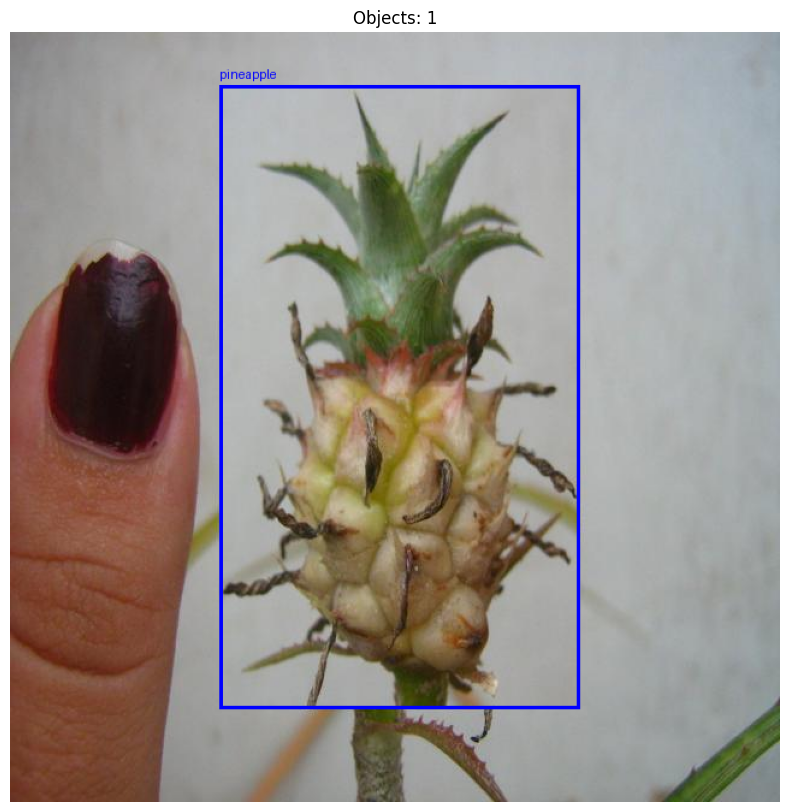


Image: 9d7e7a3f3af62836_jpg.rf.6889584f9edade3ef1a74af008e43645.jpg

Showing example with watermelon:
  Image: 3571ba354fa3c699_jpg.rf.61e48b5f010a5d747c1b135b4bbe2667.jpg


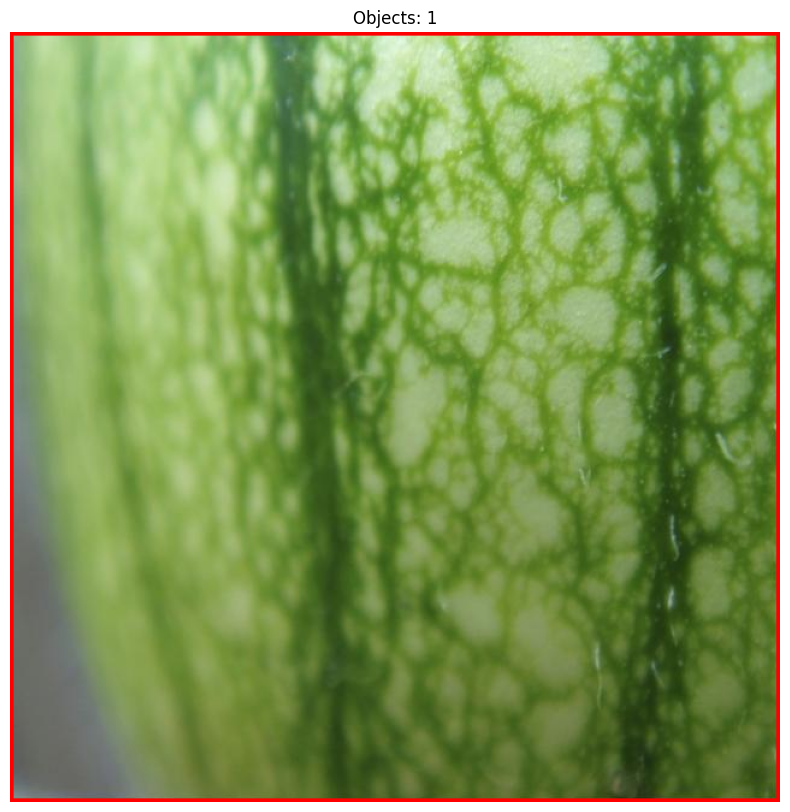


Image: 3571ba354fa3c699_jpg.rf.61e48b5f010a5d747c1b135b4bbe2667.jpg


In [53]:
show_sample_images('train') # Show 6 sample images in the training set

OBJECT DISTRIBUTION (TRAIN SET)
Class           Objects    Percentage
apple           6070            0.0%
banana          2971            0.0%
grape           6027            0.0%
orange          13938           0.0%
pineapple       1372            0.0%
watermelon      1683            0.0%


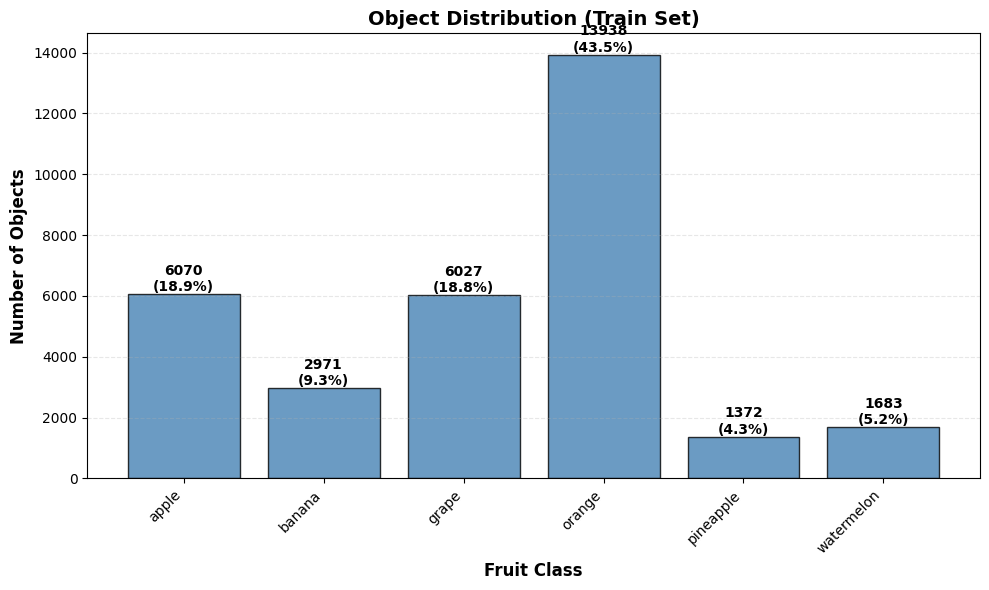

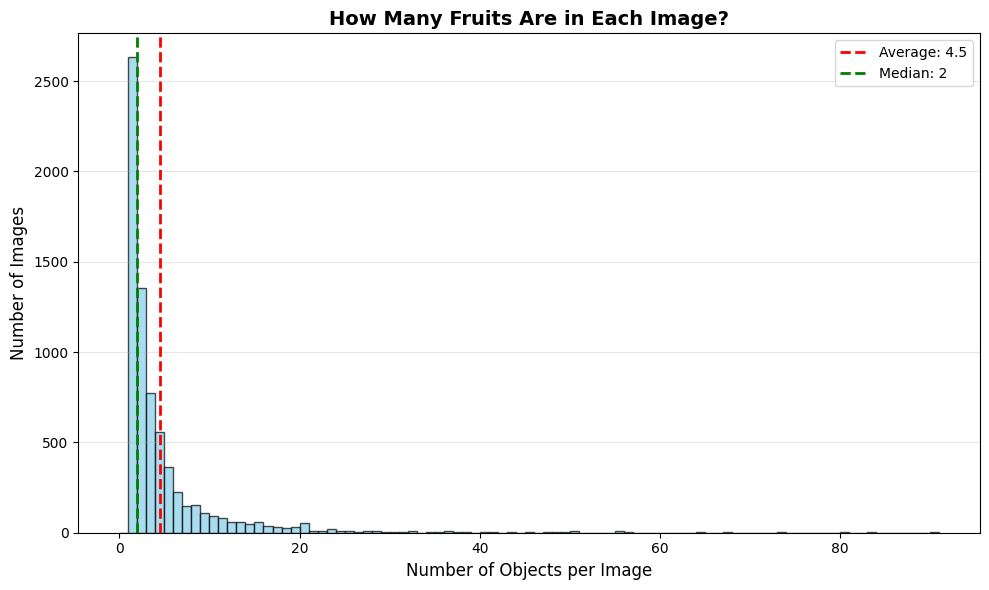

In [81]:
object_class_distribution(split='train')

OBJECT SIZE DISTRIBUTION (TRAIN SET)
Average bounding box size (% of image) per class:
apple        | Avg: 10.95% | Min:  0.01% | Max: 100.00%
banana       | Avg: 18.95% | Min:  0.01% | Max: 100.00%
grape        | Avg: 10.00% | Min:  0.00% | Max: 100.00%
orange       | Avg:  4.23% | Min:  0.00% | Max: 100.00%
pineapple    | Avg: 19.00% | Min:  0.08% | Max: 100.00%
watermelon   | Avg: 20.62% | Min:  0.05% | Max: 100.00%

Tiny objects (<1% of image area):
  12598 out of 32061 objects (39.3%)
Overall average bbox size: 9.44% of image


/tmp/ipython-input-906160253.py:67: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(bbox_areas, labels=FRUIT_CLASSES, patch_artist=True)


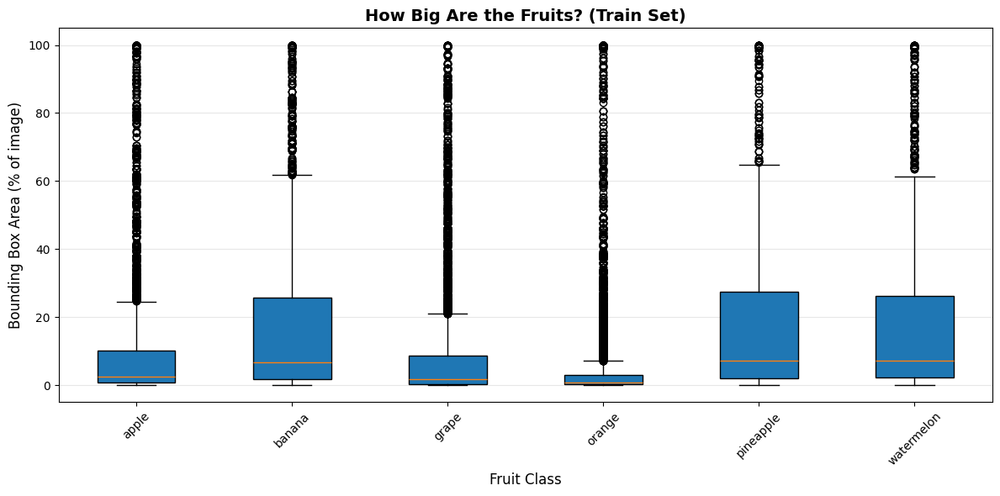

In [ ]:
object_size_distribution('train')

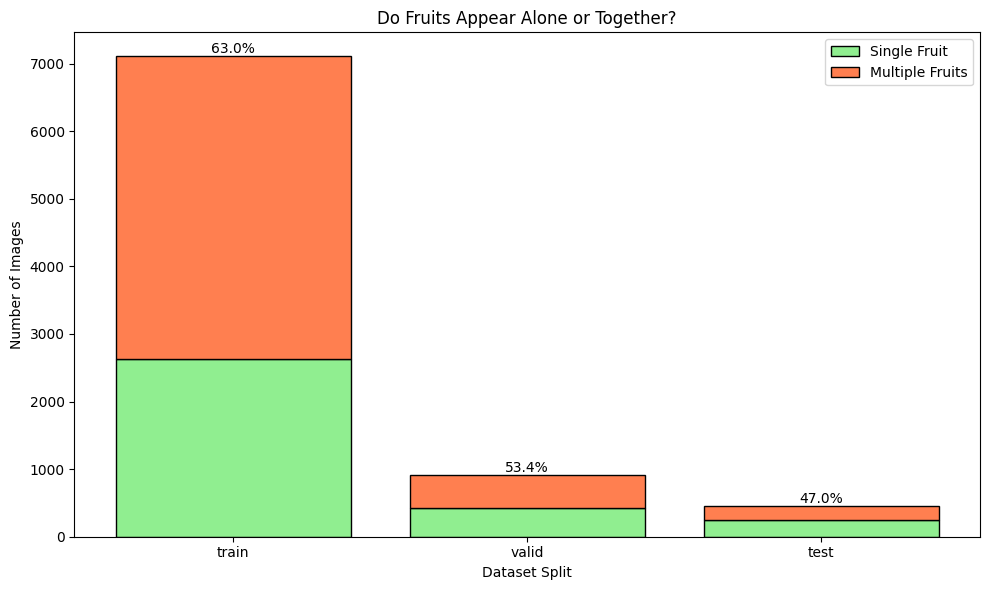

In [85]:
plot_multi_fruit_stats('./fruit-detection')

Some annotations are good but some are off the mark in terms of not identifying all the fruits of a particular class in them. Additionally some annotations have bboxes touching the edges of the image.

I'm not filtering out any objects as oranges have a lot of tiny objects and there are very few large objects anyway.

## Data Curation

In [88]:
subprocess.run(['pip', 'install', '-q', 'pycocotools'], check=True)

CompletedProcess(args=['pip', 'install', '-q', 'pycocotools'], returncode=0)

In [ ]:
add_coco_backgrounds(num_images=NUM_COCO_BACKGROUNDS,
                     exclude_classes=COCO_EXCLUDE_CLASSES,
                     train_dir=f'{dataset_root}/Fruits-detection/train')

Downloaded COCO annotations
Finding background images with no similar fruits/veggies
loading annotations into memory...
Done (t=21.00s)
creating index...
index created!
  Downloaded 100/800 images...
  Downloaded 200/800 images...
  Downloaded 300/800 images...
  Downloaded 400/800 images...
  Downloaded 500/800 images...
  Downloaded 600/800 images...
  Downloaded 700/800 images...
  Downloaded 800/800 images...

Added 800 background images
Total training images now: 7908


800

# Baseline Model

## Training

In [92]:
results_path, best_model_path = train_model(
    data_yaml='/content/fruit_data.yaml',  # Updated path from your error
    model_name='baseline',
    epochs=30,
    batch_size=16 # optimal batch size for my system resources lol 64 was crashing at epoch 1. unfortunately training may not be so stable but we move.
)

Starting training run: baseline
Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/fruit_data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=baseline, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=5, perspectiv

## Evaluation

In [117]:
# gdrive but is also best_model_path
baseline_weights_path = '/content/drive/MyDrive/fruit_detection_models/baseline/weights/best.pt'

In [118]:
# reloading from gdrive (just in case - been burned too many a time)
from ultralytics import YOLO

# Load model from Google Drive
model = YOLO(baseline_weights_path)

# Validate on test set
results = model.val(
    data='./fruit_data.yaml',
    split='test',
    conf=0.2,
    iou=0.5,
    max_det=300
)

# Extract mAP@0.5
map50 = results.box.map50
print(f"FINAL TEST SET PERFORMANCE")
print(f"mAP@0.5: {map50:.4f} ({map50*100:.2f}%)")

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 667.1±257.1 MB/s, size: 45.9 KB)
val: Scanning /content/fruit-detection/Fruits-detection/test/labels.cache... 457 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 457/457 383.0Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 29/29 2.3it/s 12.7s
                   all        457       1636      0.607      0.394      0.511      0.381
                 apple        113        422      0.642      0.339      0.497      0.407
                banana         88        174      0.612       0.42      0.503      0.335
                 grape         94        366      0.613      0.418      0.538      0.376
                orange         92        511      0.579      0.286      0.432      0.309
             pineapple  

Running validation on test set.
Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 869.9±375.0 MB/s, size: 55.3 KB)
val: Scanning /content/fruit-detection/Fruits-detection/test/labels.cache... 457 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 457/457 241.9Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 29/29 2.3it/s 12.7s
                   all        457       1636      0.522      0.443      0.501      0.363
                 apple        113        422      0.559        0.4      0.484      0.383
                banana         88        174       0.53       0.46      0.492      0.321
                 grape         94        366      0.489      0.456      0.519       0.35
                orange         92        511      0.483      0.341      0.409    

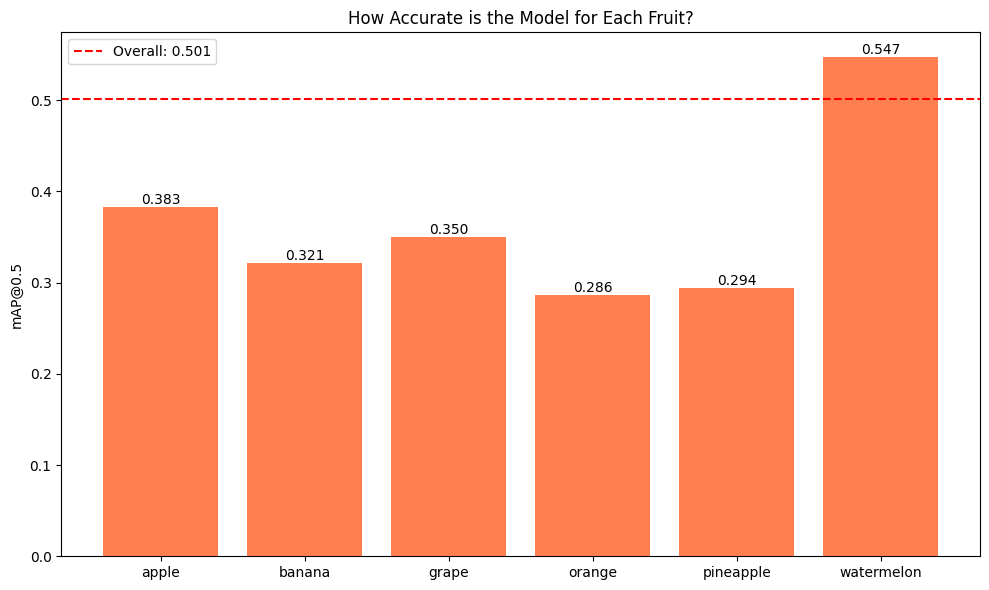


✓ Displaying: confusion_matrix_normalized.png


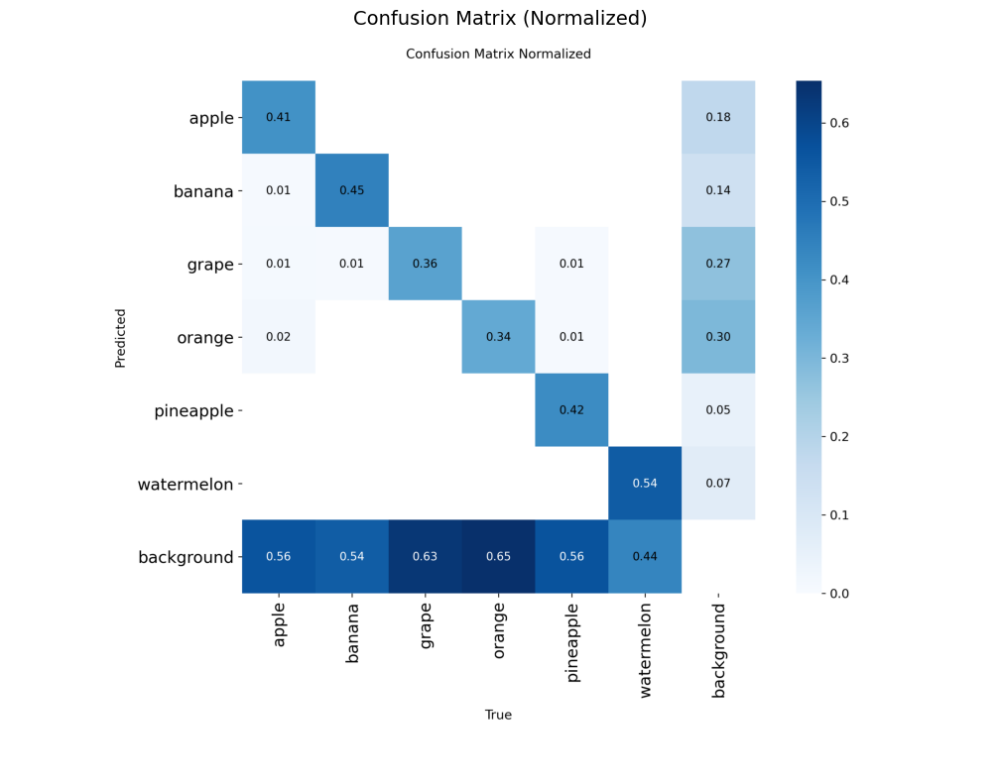


✓ Displaying: BoxPR_curve.png


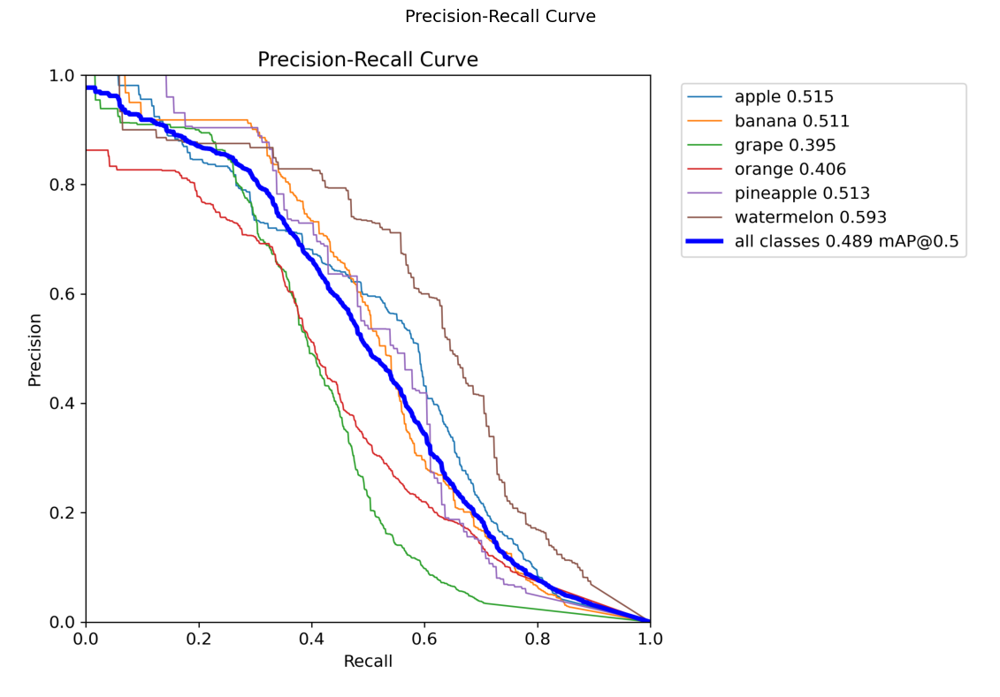


✓ Displaying: BoxF1_curve.png


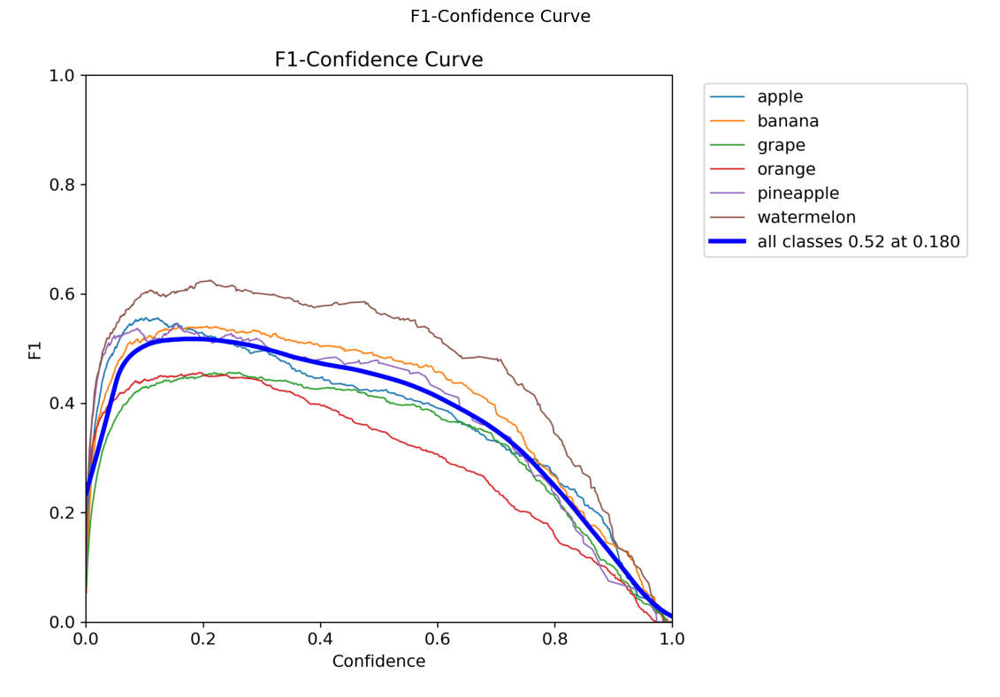


✓ Displaying: BoxP_curve.png


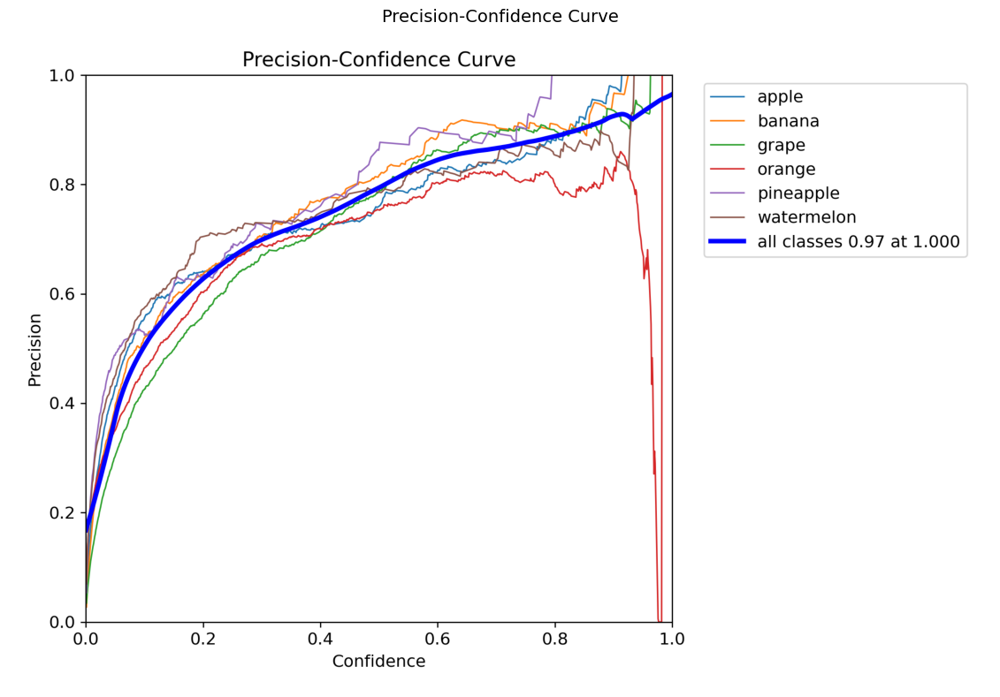


✓ Displaying: BoxR_curve.png


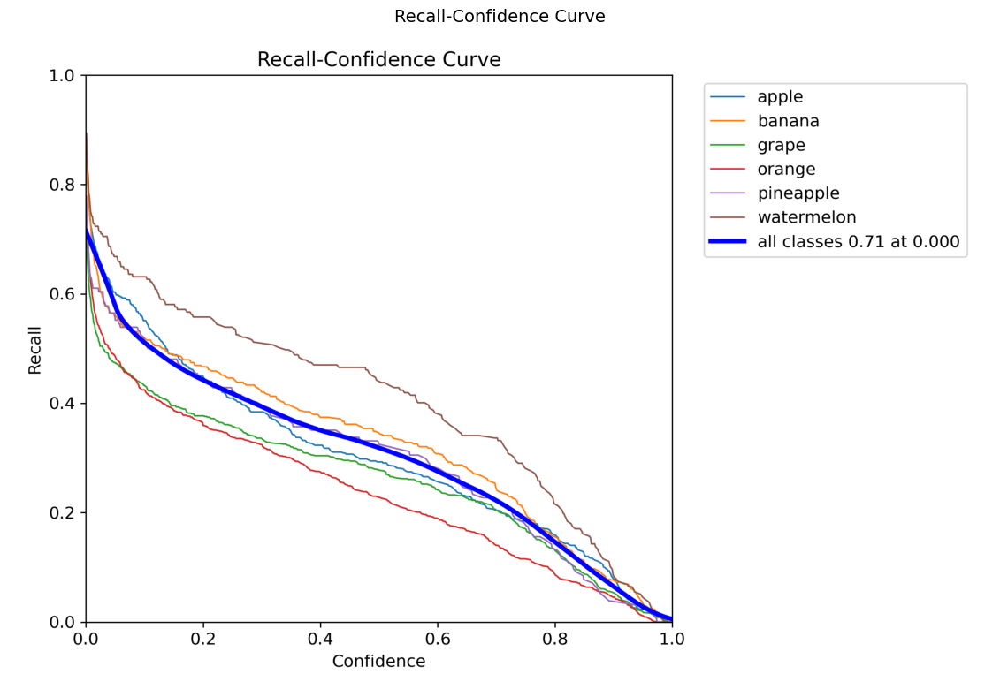

In [110]:
# Usage - one function call:
plot_all_metrics(
    model_path='/content/drive/MyDrive/fruit_detection_models/baseline/weights/best.pt',
    results_path='/content/drive/MyDrive/fruit_detection_models/baseline'
)

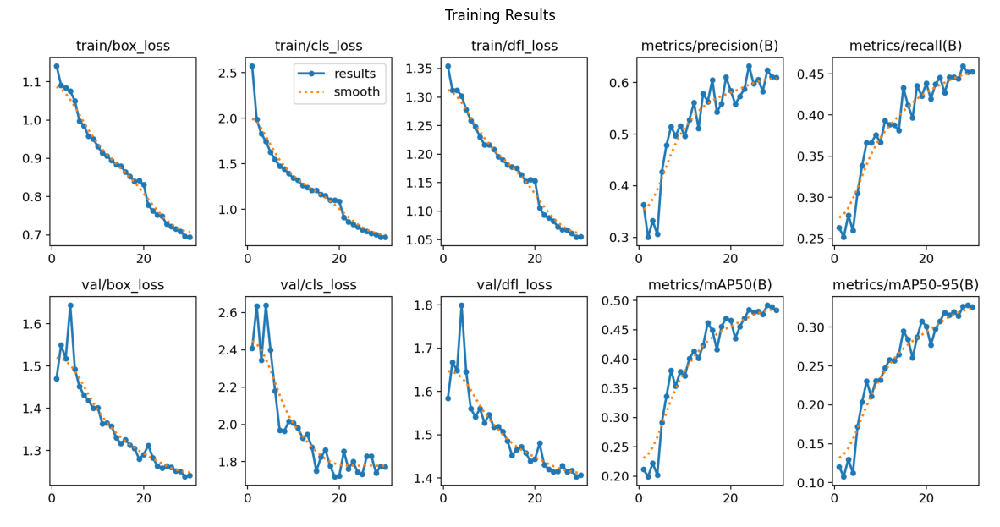

In [106]:
show_training_results('/content/drive/MyDrive/fruit_detection_models/baseline')

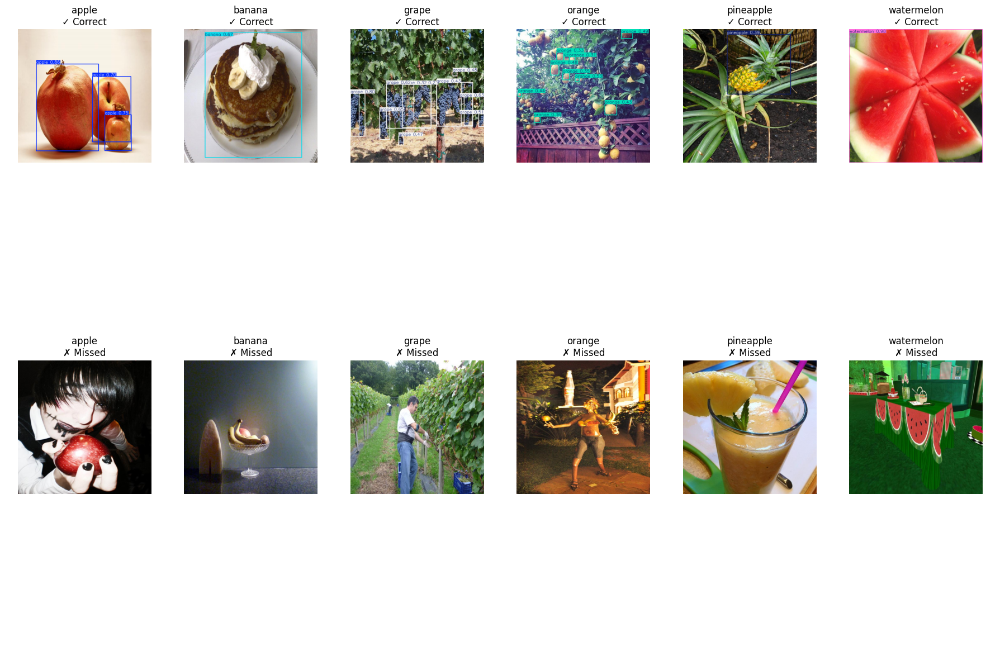

In [107]:
show_predictions(best_model_path, dataset_root)

Looking through 457 images...


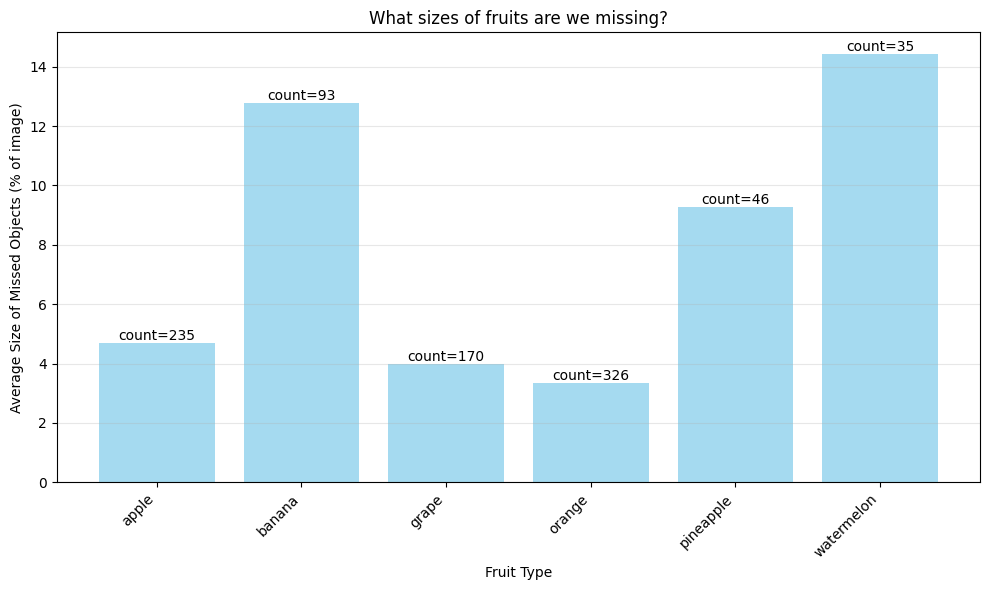

In [57]:
analyze_missed_detection_sizes(
    model_path='/content/drive/MyDrive/fruit_detection_models/baseline/weights/best.pt',
    split='test'
)

# New Model

In [24]:
# Google Drive root directory
drive_root = Path("/content/drive/MyDrive/fruit_detection_models")
drive_root.mkdir(parents=True, exist_ok=True)
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Phase 1: Freeze Backbone

In [112]:
# freeze backbone, first 10 layers
model = YOLO('yolov8n.pt')

results_phase1 = model.train(
    data='fruit_data.yaml',
    epochs=15,  # Reduced to total 50 epochs across all phases
    imgsz=640,
    batch=8, # reduced batch size to 8 to reduce memory errors

    freeze=10,
    lr0=0.005,

    optimizer='AdamW',  # Better than 'auto' for fine-tuning
    cls=0.6,           # adjusting classification loss (higher to increase recall)

    # Augmentation
    mosaic=1.0,
    mixup=0.1,
    multi_scale=True,

    patience=10,

    name='phase1_frozen_backbone',
    project='fruit_detection',
    exist_ok=True,
    save=True,
    save_period=5
)

# Backup Phase 1 to Google Drive
phase1_local = Path(results_phase1.save_dir)
phase1_drive = drive_root / "phase1_frozen_backbone"
shutil.copytree(phase1_local, phase1_drive, dirs_exist_ok=True)

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.6, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=fruit_data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=10, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=True, name=phase1_frozen_backbone, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=10, perspective=0.0, plots=True, pose=12.0

PosixPath('/content/drive/MyDrive/fruit_detection_models/phase1_frozen_backbone')

In [114]:
phase1_results = model.val(
    data='fruit_data.yaml',
    split='test',
    conf=0.2,
    iou=0.5,
    max_det=300
)

# Extract mAP@0.5
map50 = phase1_results.box.map50
print(f"FINAL TEST SET PERFORMANCE")
print(f"mAP@0.5: {map50:.4f} ({map50*100:.2f}%)")

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 593.3±409.2 MB/s, size: 60.8 KB)
val: Scanning /content/fruit-detection/Fruits-detection/test/labels.cache... 457 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 457/457 143.0Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 29/29 2.3it/s 12.4s
                   all        457       1636      0.547      0.405      0.483      0.326
                 apple        113        422      0.578       0.37      0.478      0.379
                banana         88        174      0.623      0.437      0.542      0.323
                 grape         94        366      0.645      0.388      0.523      0.331
                orange         92        511      0.499      0.366      0.434      0.288
             pineapple         40         87       0.49      0.276      0.366      0.223
            wat

## Phase 2: Partially freeze layers

In [115]:
# partially freeze layers
model = YOLO('fruit_detection/phase1_frozen_backbone/weights/best.pt') # Load best weights from Phase 1

results_phase2 = model.train(
    data='fruit_data.yaml',
    epochs=20,
    imgsz=640,
    batch=8,

    freeze=5,
    lr0=0.001,

    optimizer='AdamW',
    cls=0.6,

    # Augmentation
    mosaic=1.0,
    mixup=0.1,
    multi_scale=True,

    patience=10,

    name='phase2_partial_unfreeze',
    project='fruit_detection',
    exist_ok=True,
    save=True,
    save_period=5
)

# Backup Phase 2 to Google Drive
phase2_local = Path(results_phase2.save_dir)
phase2_drive = drive_root / "phase2_partial_unfreeze"
shutil.copytree(phase2_local, phase2_drive, dirs_exist_ok=True)

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.6, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=fruit_data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=5, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=fruit_detection/phase1_frozen_backbone/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=True, name=phase2_partial_unfreeze, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patienc

PosixPath('/content/drive/MyDrive/fruit_detection_models/phase2_partial_unfreeze')

In [116]:
phase2_results = model.val(
    data='fruit_data.yaml',
    split='test',
    conf=0.2,
    iou=0.5,
    max_det=300
)

# Extract mAP@0.5
map50 = phase2_results.box.map50
print(f"FINAL TEST SET PERFORMANCE")
print(f"mAP@0.5: {map50:.4f} ({map50*100:.2f}%)")

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 692.7±349.4 MB/s, size: 49.3 KB)
val: Scanning /content/fruit-detection/Fruits-detection/test/labels.cache... 457 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 457/457 274.0Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 29/29 2.4it/s 11.9s
                   all        457       1636      0.571      0.419      0.514       0.36
                 apple        113        422      0.557      0.391      0.491      0.379
                banana         88        174      0.621      0.414      0.543      0.341
                 grape         94        366      0.656      0.407      0.551      0.379
                orange         92        511       0.48      0.344      0.424      0.286
             pineapple  

## Phase 3: Full Fine-Tuning

In [122]:
# full fine tuning
model = YOLO('fruit_detection/phase2_partial_unfreeze/weights/best.pt')

results_phase3 = model.train(
    data='fruit_data.yaml',
    epochs=15,
    imgsz=640,
    batch=8,

    freeze=0,
    lr0=0.0002,

    optimizer='AdamW',
    cls=0.6,

    # Reduced augmentation for final phase
    mosaic=0.5,
    mixup=0.05,
    multi_scale=True,

    patience=7,

    name='phase3_full_finetune',
    project='fruit_detection',
    exist_ok=True,
    save=True,
    save_period=5
)

# Backup Phase 3 to Google Drive
phase3_local = Path(results_phase3.save_dir)
phase3_drive = drive_root / "phase3_full_finetune"
shutil.copytree(phase3_local, phase3_drive, dirs_exist_ok=True)

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.6, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=fruit_data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=0, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0002, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.05, mode=train, model=fruit_detection/phase2_partial_unfreeze/weights/best.pt, momentum=0.937, mosaic=0.5, multi_scale=True, name=phase3_full_finetune, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patienc

PosixPath('/content/drive/MyDrive/fruit_detection_models/phase3_full_finetune')

In [28]:
# Load final model from Google Drive
final_results_path = '/content/drive/MyDrive/fruit_detection_models/phase3_full_finetune'
final_model_path = '/content/drive/MyDrive/fruit_detection_models/phase3_full_finetune/weights/best.pt'
final_model = YOLO(final_model_path)

test_results = final_model.val(
    data='fruit_data.yaml',
    split='test',
    conf=0.2,
    iou=0.5,
    max_det=300
)

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 860.4±259.3 MB/s, size: 37.5 KB)
val: Scanning /content/fruit-detection/Fruits-detection/test/labels... 457 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 457/457 2.0Kit/s 0.2s
val: New cache created: /content/fruit-detection/Fruits-detection/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 29/29 4.8it/s 6.1s
                   all        457       1636      0.577       0.41      0.512      0.366
                 apple        113        422      0.634      0.365      0.513      0.396
                banana         88        174      0.595      0.414      0.525      0.341
                 grape         94        366      0.639      0.415      0.556      0.387
                orange         92     

In [124]:
# Print summary
print(f"Final model: {final_model_path}")
print(f"mAP@0.5: {test_results.box.map50*100:.2f}%")
print(f"mAP@0.5:0.95: {test_results.box.map*100:.2f}%")
print(f"Precision: {test_results.box.mp:.4f}")
print(f"Recall: {test_results.box.mr:.4f}")

Final model: /content/drive/MyDrive/fruit_detection_models/phase3_full_finetune/weights/best.pt
mAP@0.5: 51.19%
mAP@0.5:0.95: 36.64%
Precision: 0.5773
Recall: 0.4095


Running validation on test set.
Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2003.1±805.2 MB/s, size: 61.5 KB)
val: Scanning /content/fruit-detection/Fruits-detection/test/labels.cache... 457 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 457/457 936.4Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 29/29 5.4it/s 5.4s
                   all        457       1636      0.547      0.439      0.496      0.345
                 apple        113        422      0.603      0.393      0.507       0.38
                banana         88        174      0.539      0.425      0.505      0.316
                 grape         94        366      0.597      0.429       0.52      0.352
                orange         92        511       0.54      0.337      0.416    

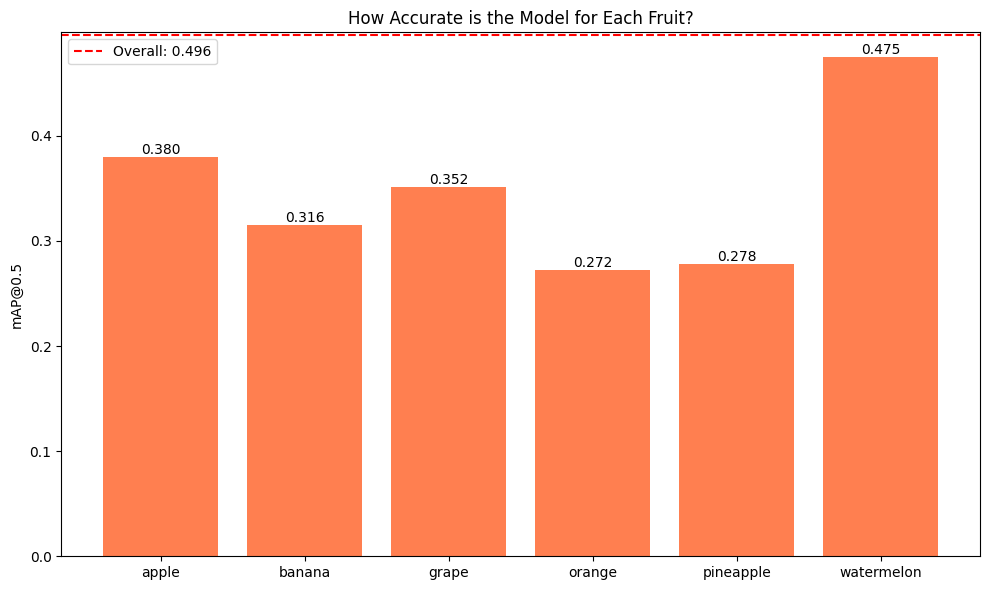


✓ Displaying: confusion_matrix_normalized.png


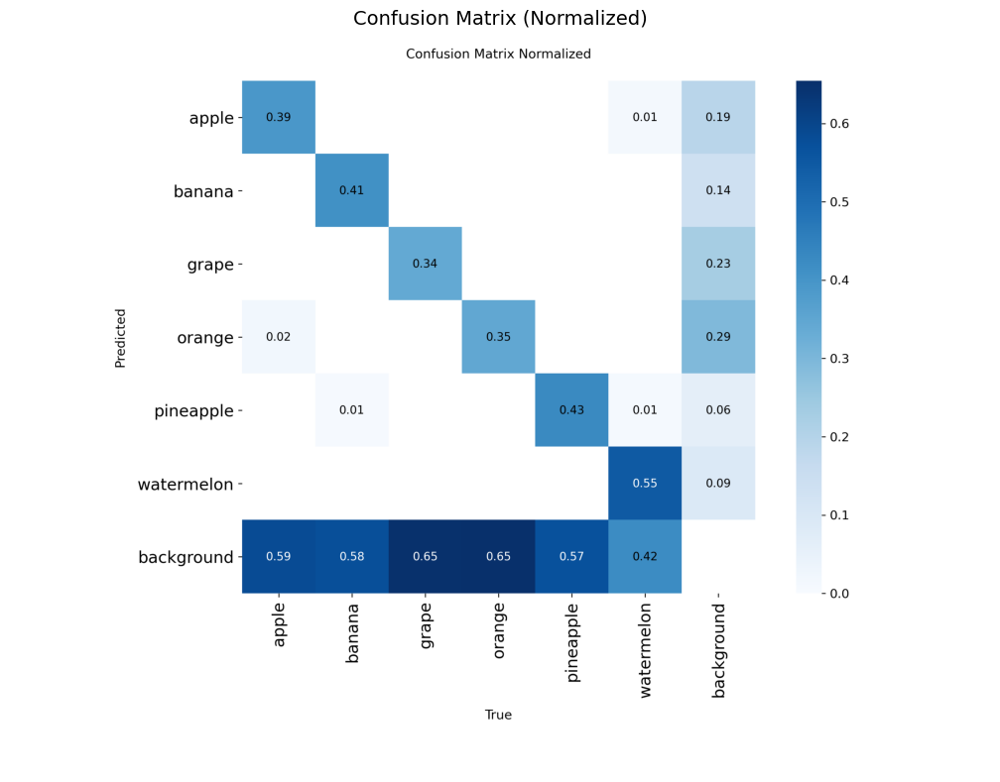


✓ Displaying: BoxPR_curve.png


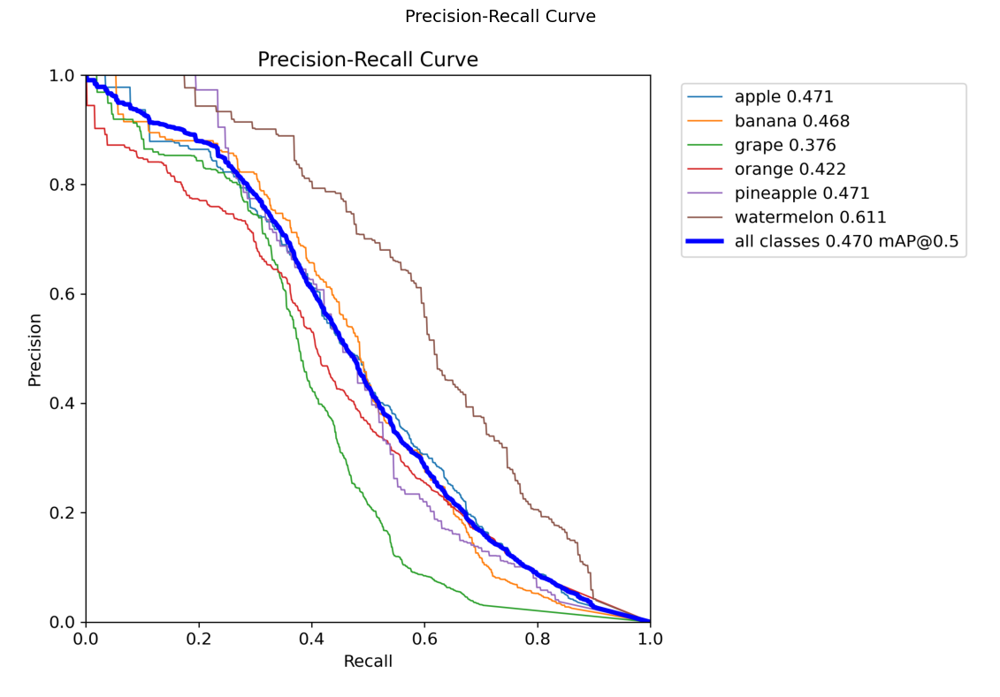


✓ Displaying: BoxF1_curve.png


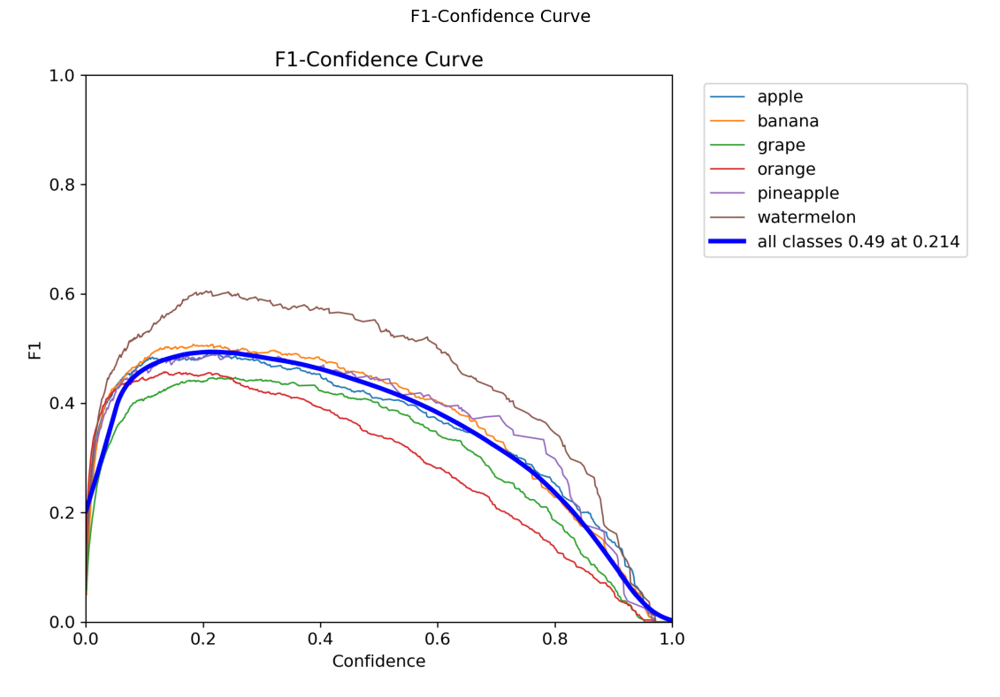


✓ Displaying: BoxP_curve.png


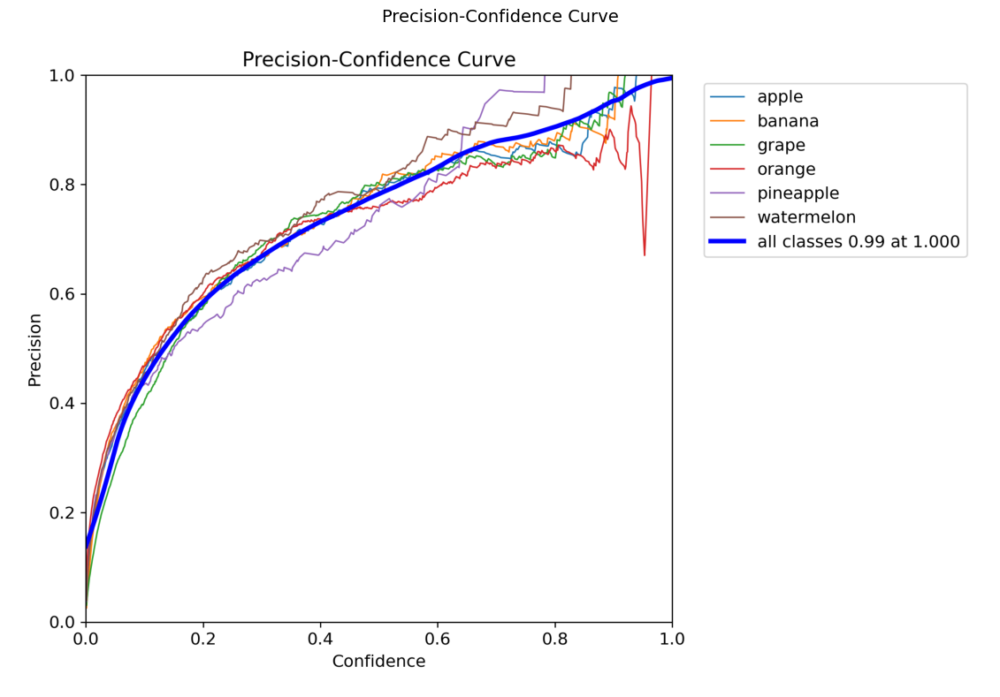


✓ Displaying: BoxR_curve.png


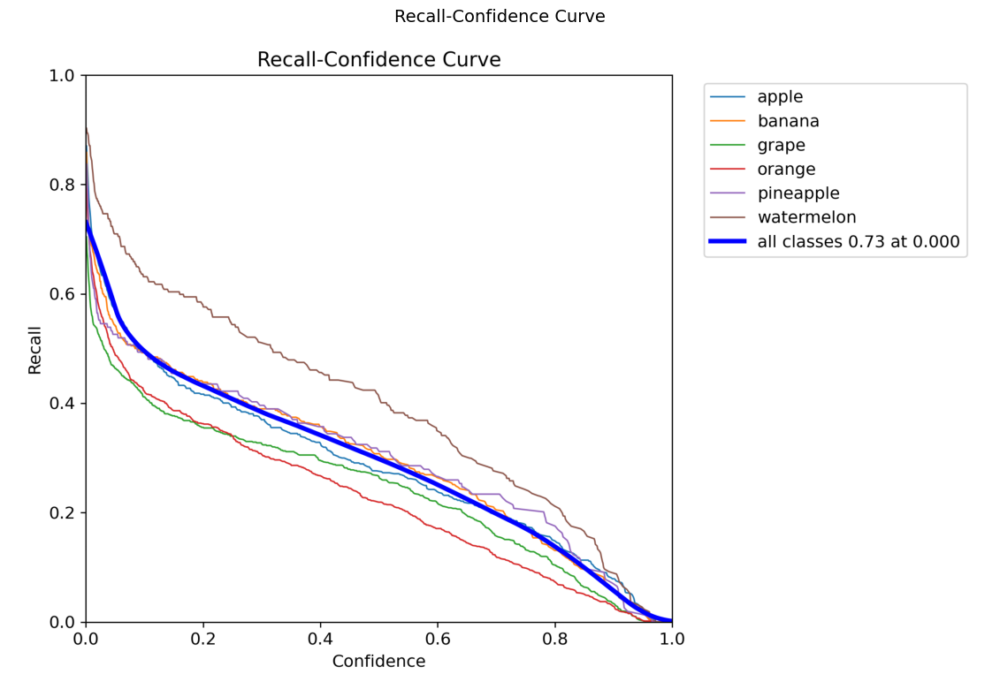

In [29]:
# Usage - one function call:
plot_all_metrics(
    model_path=final_model_path,
    results_path=final_results_path
)

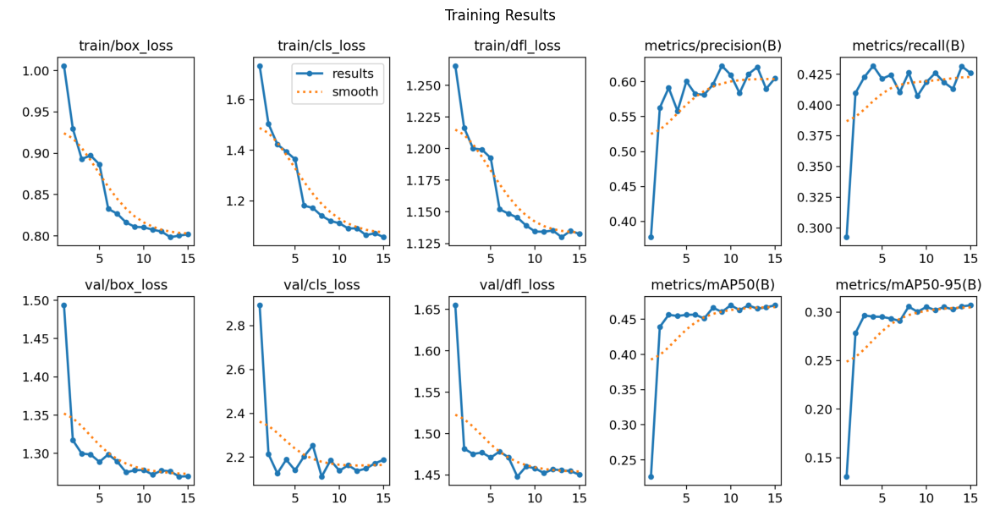

In [33]:
show_training_results(final_results_path)

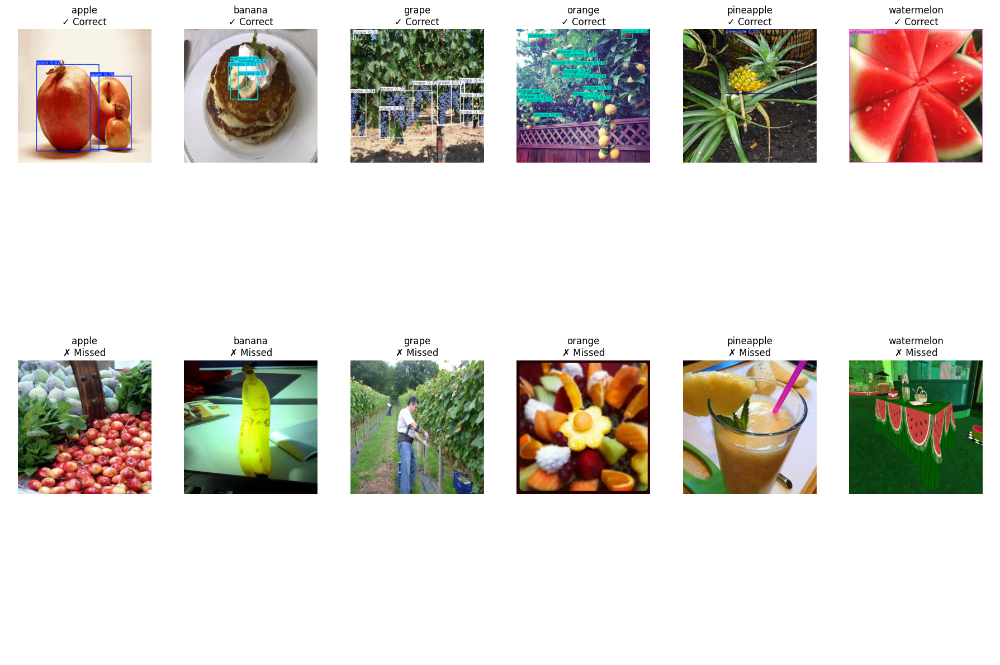

In [34]:
show_predictions(final_model_path, dataset_root)

Looking through 457 images...


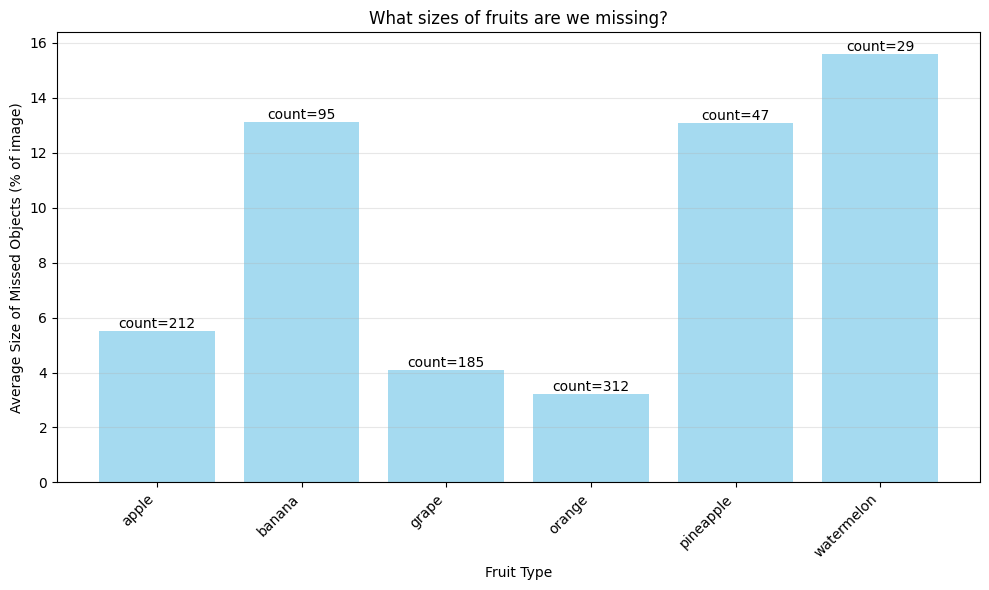

In [58]:
analyze_missed_detection_sizes(
    model_path='/content/drive/MyDrive/fruit_detection_models/phase3_full_finetune/weights/best.pt',
    split='test'
)